In [1]:
from calculations_utils import *
from plot_utils import *
import datetime
import warnings
plt.rcParams["figure.figsize"] = (10,8)
plt.rcParams.update({'font.size': 18})

# Fig 1

In [2]:
mob = 10**4
R = 2*10**-9
T = 300
omega_ev_array = np.logspace(np.log10(0.01),np.log10(0.3),100)
kp_vac_025 = []
kp_vac_05 = []
kp_vac_075 = []
kp_vac_1 = []
for omega_ev in omega_ev_array:
    omega = e*omega_ev/hbar

    mu = 0.25*e
    sigma, _ = conductivity(omega, mu, tau_g(mob,mu), T)
    kp_vac_025.append(c*kp_res(0, sigma, omega, mu, tau_g(mob,mu), T, R, 150, epsilon = 1)/omega)

    mu = 0.5*e
    sigma, _ = conductivity(omega, mu, tau_g(mob,mu), T)
    kp_vac_05.append(c*kp_res(0, sigma, omega, mu, tau_g(mob,mu), T, R, 60, epsilon = 1)/omega)

    mu = 0.75*e
    sigma, _ = conductivity(omega, mu, tau_g(mob,mu), T)
    kp_vac_075.append(c*kp_res(0, sigma, omega, mu, tau_g(mob,mu), T, R, 60, epsilon = 1)/omega)

    mu = e
    sigma, _ = conductivity(omega, mu, tau_g(mob,mu), T)
    kp_vac_1.append(c*kp_res(0, sigma, omega, mu, tau_g(mob,mu), T, R, 60, epsilon = 1)/omega)

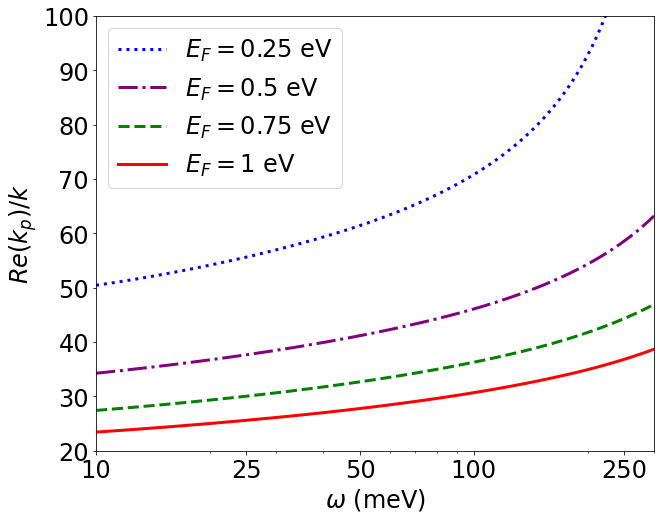

In [7]:
plt.rcParams["figure.figsize"] = (10,8)
plt.rcParams.update({'font.size': 24})

plt.plot(1000*omega_ev_array,np.real(kp_vac_025), linewidth=3, color='blue', label='$E_F = 0.25$ eV', linestyle='dotted')
plt.plot(1000*omega_ev_array,np.real(kp_vac_05), linewidth=3, color='purple', label='$E_F = 0.5$ eV', linestyle='dashdot')
plt.plot(1000*omega_ev_array,np.real(kp_vac_075), linewidth=3, color='green', label='$E_F = 0.75$ eV', linestyle='dashed')
plt.plot(1000*omega_ev_array,np.real(kp_vac_1), linewidth=3, color='red', label='$E_F = 1$ eV')

plt.xscale('log')
#plt.yscale('log')

plt.xlim([10,300])
plt.ylim([20,100])
plt.legend()
plt.xticks(ticks = [10,25,50,100,250], labels=[10,25,50,100,250])
plt.xlabel('$\omega$ (meV)')
plt.ylabel('$Re(k_p)/k$')
plt.savefig('figs/fig1b')
plt.show()

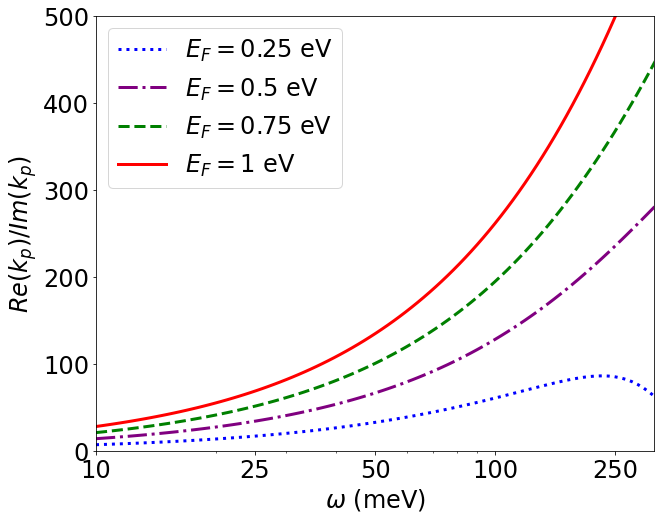

In [8]:
plt.plot(1000*omega_ev_array,np.real(kp_vac_025)/np.imag(kp_vac_025), linewidth=3, color='blue', label='$E_F = 0.25$ eV', linestyle='dotted')
plt.plot(1000*omega_ev_array,np.real(kp_vac_05)/np.imag(kp_vac_05), linewidth=3, color='purple', label='$E_F = 0.5$ eV', linestyle='dashdot')
plt.plot(1000*omega_ev_array,np.real(kp_vac_075)/np.imag(kp_vac_075), linewidth=3, color='green', label='$E_F = 0.75$ eV', linestyle='dashed')
plt.plot(1000*omega_ev_array,np.real(kp_vac_1)/np.imag(kp_vac_1), linewidth=3, color='red', label='$E_F = 1$ eV')

plt.xscale('log')
#plt.yscale('log')

plt.xlim([10,250])
plt.ylim([0,500])
plt.legend()
plt.xticks(ticks = [10,25,50,100,200], labels=[10,25,50,100,250])
plt.xlabel('$\omega$ (meV)')
plt.ylabel('$Re(k_p)/Im(k_p)$')
plt.savefig('figs/fig1c')
plt.show()

# Fig 2

In [ ]:
T = 300
R = 2*10**(-9)
mu_ev_array = np.array([0.25,0.5,0.75,1])
mob = 10**4
MCut = 10
m_max = 10
omegaCut = 0.0000044*e/hbar

ne = 5
ng = 4
d_matrix = []
dne = []
dng = []
for m in range(2,MCut + 1):
    dne.append(d(ne,m))
    dng.append(d(ng,m))

d_matrix.append(dne)
d_matrix.append(dng)

distances_nm = np.logspace(0,3,61)
Gammas = []
for mu_ev in mu_ev_array:
    print('\nmu (ev):', mu_ev)
    Gamma_mu = []
    for distance_nm in distances_nm:
        print('d (nm):', distance_nm)
        Gamma_mu.append(Gamma(d_matrix, ne, ng, mu_ev*e, tau_g(mob,mu_ev*e), T, R, R + distance_nm*10**(-9), m_max, MCut, omegaCut))
    Gammas.append(Gamma_mu)

np.save('Gamma_CNT.npy',np.array(Gammas))

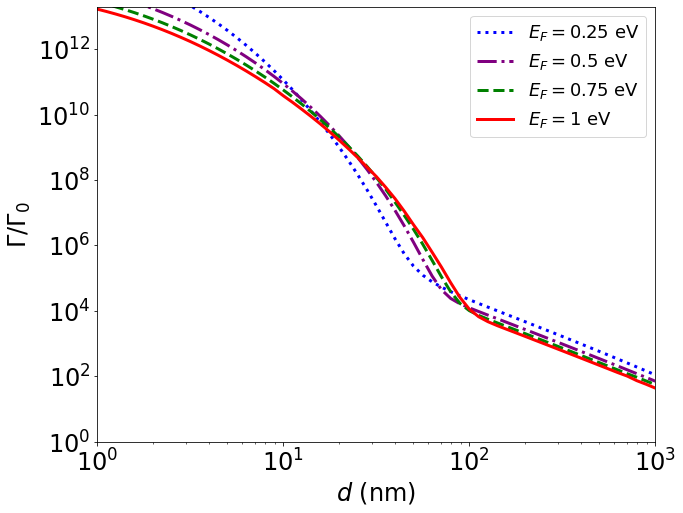

In [48]:
plt.rcParams.update({'font.size': 24})

Gammas = np.load('Gamma_CNT.npy')

omegaCut = 0.0000044*e/hbar
MCut = 10
ne = 5
ng = 4
d_matrix = []
dne = []
dng = []
for m in range(2,MCut + 1):
    dne.append(d(ne,m))
    dng.append(d(ng,m))
d_matrix.append(dne)
d_matrix.append(dng)
G0 = Gamma_0(d_matrix, 5, 4, 10, omegaCut)

distances_nm = np.logspace(0,3,61)

plt.plot(distances_nm,Gammas[0]/G0, linewidth=3, color='blue', label='$E_F = 0.25$ eV', linestyle='dotted')
plt.plot(distances_nm,Gammas[1]/G0, linewidth=3, color='purple', label='$E_F = 0.5$ eV', linestyle='dashdot')
plt.plot(distances_nm,Gammas[2]/G0, linewidth=3, color='green', label='$E_F = 0.75$ eV', linestyle='dashed')
plt.plot(distances_nm,Gammas[3]/G0, linewidth=3, color='red', label='$E_F = 1$ eV')


plt.xlim([1,1000])
plt.ylim([1,2*10**13])
plt.legend(loc='upper right', fontsize=18)
plt.xlabel('$d$ (nm)')
plt.ylabel('$\Gamma/\Gamma_0$')
plt.xscale('log')
plt.yscale('log')
plt.savefig('figs/fig2a')
plt.show()

In [2]:
T = 300
R = 2*10**(-9)
mu_ev_array = np.array([0.25,0.5,0.75,1])
mob = 10**4
MCut = 10
m_max = 10
omegaCut = 0.0000044*e/hbar

ne = 5
ng = 4
d_matrix = []
dne = []
dng = []
for m in range(2,MCut + 1):
    dne.append(d(ne,m))
    dng.append(d(ng,m))

d_matrix.append(dne)
d_matrix.append(dng)

distances_nm = np.logspace(0,3,61)
Gamma054 = Gamma01ph(5,4)
Gamma053 = Gamma01ph(5,3)
Gamma052 = Gamma01ph(5,2)
Gammas = []
for mu_ev in mu_ev_array:
    print('\nmu (ev):', mu_ev)
    Gamma_mu = []
    for distance_nm in distances_nm:
        print('d (nm):', distance_nm)
        Gamma54 = Gamma054*P_iso(domega(5,4), mu_ev*e, tau_g(mob,mu_ev*e), T, R, R + distance_nm*10**(-9), m_max)
        Gamma53 = Gamma053*P_iso(domega(5,3), mu_ev*e, tau_g(mob,mu_ev*e), T, R, R + distance_nm*10**(-9), m_max)
        Gamma52 = Gamma052*P_iso(domega(5,2), mu_ev*e, tau_g(mob,mu_ev*e), T, R, R + distance_nm*10**(-9), m_max)
        Gamma_mu.append(Gamma54 + Gamma53 + Gamma52)
    Gammas.append(Gamma_mu)

np.save('Gamma_CNT_1ph.npy',np.array(Gammas))


mu (ev): 0.25
d (nm): 1.0
d (nm): 1.1220184543019633
d (nm): 1.2589254117941673
d (nm): 1.4125375446227544
d (nm): 1.5848931924611136
d (nm): 1.7782794100389228
d (nm): 1.9952623149688797
d (nm): 2.23872113856834
d (nm): 2.51188643150958
d (nm): 2.8183829312644537
d (nm): 3.1622776601683795
d (nm): 3.548133892335755
d (nm): 3.981071705534973
d (nm): 4.466835921509632
d (nm): 5.011872336272724
d (nm): 5.623413251903491
d (nm): 6.309573444801933
d (nm): 7.07945784384138
d (nm): 7.943282347242816
d (nm): 8.912509381337456
d (nm): 10.0
d (nm): 11.220184543019636
d (nm): 12.589254117941675
d (nm): 14.125375446227547
d (nm): 15.848931924611142
d (nm): 17.78279410038923
d (nm): 19.952623149688797
d (nm): 22.3872113856834
d (nm): 25.11886431509581
d (nm): 28.18382931264455
d (nm): 31.622776601683793
d (nm): 35.48133892335755
d (nm): 39.810717055349734
d (nm): 44.668359215096324
d (nm): 50.11872336272725
d (nm): 56.23413251903491
d (nm): 63.09573444801933
d (nm): 70.79457843841381
d (nm): 79.4

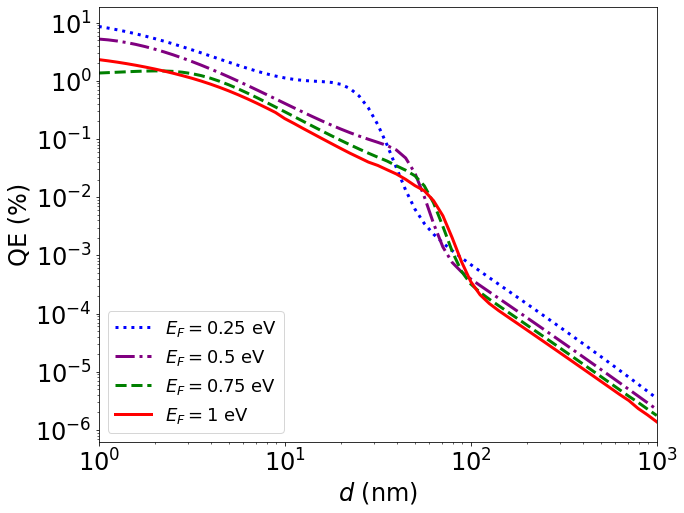

In [49]:
Gammas = np.load('Gamma_CNT.npy')
Gammas1ph = np.load('Gamma_CNT_1ph.npy')
QEs = 100*Gammas/(Gammas + Gammas1ph)
distances_nm = np.logspace(0,3,61)

plt.plot(distances_nm,QEs[0], linewidth=3, color='blue', label='$E_F = 0.25$ eV', linestyle='dotted')
plt.plot(distances_nm,QEs[1], linewidth=3, color='purple', label='$E_F = 0.5$ eV', linestyle='dashdot')
plt.plot(distances_nm,QEs[2], linewidth=3, color='green', label='$E_F = 0.75$ eV', linestyle='dashed')
plt.plot(distances_nm,QEs[3], linewidth=3, color='red', label='$E_F = 1$ eV')


plt.xlim([1,1000])
#plt.ylim([2*10**4,2*10**13])
plt.legend(loc='lower left', fontsize=18)
plt.xlabel('$d$ (nm)')
plt.ylabel('QE (%)')
plt.yscale('log')
plt.xscale('log')
plt.savefig('figs/fig2b')
plt.show()

In [18]:
lambda_0 = 4.05*10**(-6)
omega_0 = 2*np.pi*c/lambda_0
mu_ev_array = np.array([0.25,0.5,0.75,1])
T = 300
R = 2*10**(-9)
d = R + 10*10**(-9)
m_max = 5

gammas = []
omega_steps = np.linspace(0.01,0.5,50)
for mu_ev in mu_ev_array:
    print(mu_ev)
    gamma_mu = []
    for step in omega_steps:
        gamma_mu.append(gamma(omega_0, omega_0*step, mu_ev*e, tau_g(10**4,mu_ev*e), T, R, d, m_max))
    gammas.append(gamma_mu)

0.25
0.5
0.75
1.0
c:\Users\Yuri\Documents\doutorado\nanotubos\carbon_nanotubes\calculations_utils.py:162: IntegrationWarning: The integral is probably divergent, or slowly convergent.
  integral = integrate.quad(integrand, 0, 10/R)


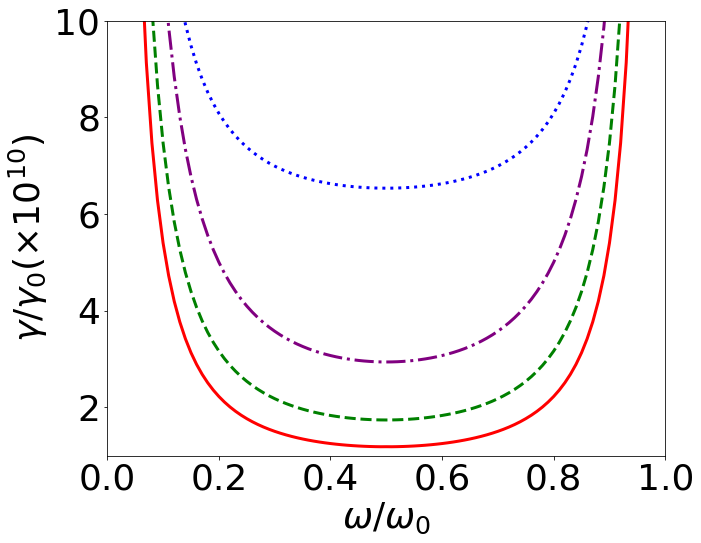

In [33]:
plt.rcParams.update({'font.size': 36})

# Fixing a small numerical error
gammas[3][-1] = (gammas[3][-3] + gammas[3][-2])/2

plt.plot(np.linspace(0.01,0.99,99),np.array(gammas[0][:-1] + gammas[0][::-1])/(10**10), linewidth=3, color='blue', label='$E_F = 0.25$ eV', linestyle='dotted')
plt.plot(np.linspace(0.01,0.99,99),np.array(gammas[1][:-1] + gammas[1][::-1])/(10**10), linewidth=3, color='purple', label='$E_F = 0.5$ eV', linestyle='dashdot')
plt.plot(np.linspace(0.01,0.99,99),np.array(gammas[2][:-1] + gammas[2][::-1])/(10**10), linewidth=3, color='green', label='$E_F = 0.75$ eV', linestyle='dashed')
plt.plot(np.linspace(0.01,0.99,99),np.array(gammas[3][:-1] + gammas[3][::-1])/(10**10), linewidth=3, color='red', label='$E_F = 1$ eV')

plt.xlim([0,1])
plt.ylim([1,10])
plt.xlabel('$\omega/\omega_0$')
plt.ylabel(r'$\gamma/\gamma_0 (\times 10^{10})$')
#plt.yscale('log')
plt.savefig('figs/fig2ainset', bbox_inches = "tight")
plt.show()

# Fig 3

In [13]:
mob = 10**4
mu = e
T = 300
epsilon_sil = 11.68
omega_ev_array = np.linspace(0.01,0.3,100)
kp_sil_10_0 = []
kp_sil_10_1 = []
kp_sil_14_0 = []
kp_sil_14_1 = []
kp_sil_14_2 = []
kp_sil_18_0 = []
kp_sil_18_1 = []
kp_sil_18_2 = []
kp_sil_18_3 = []
for omega_ev in omega_ev_array:
    omega = e*omega_ev/hbar
    sigma, _ = conductivity(omega, mu, tau_g(mob,mu), T)

    R = 10*10**-9
    kp_sil_10_0.append(c*kp_res(0, sigma, omega, mu, tau_g(mob,mu), T, R, 150, epsilon = epsilon_sil)/omega)
    kp_sil_10_1.append(c*kp_res(1, sigma, omega, mu, tau_g(mob,mu), T, R, 60, epsilon = epsilon_sil)/omega)

    R = 14*10**-9
    kp_sil_14_0.append(c*kp_res(0, sigma, omega, mu, tau_g(mob,mu), T, R, 150, epsilon = epsilon_sil)/omega)
    kp_sil_14_1.append(c*kp_res(1, sigma, omega, mu, tau_g(mob,mu), T, R, 60, epsilon = epsilon_sil)/omega)
    kp_sil_14_2.append(c*kp_res(2, sigma, omega, mu, tau_g(mob,mu), T, R, 60, epsilon = epsilon_sil)/omega)

    R = 18*10**-9
    kp_sil_18_0.append(c*kp_res(0, sigma, omega, mu, tau_g(mob,mu), T, R, 150, epsilon = epsilon_sil)/omega)
    kp_sil_18_1.append(c*kp_res(1, sigma, omega, mu, tau_g(mob,mu), T, R, 60, epsilon = epsilon_sil)/omega)
    kp_sil_18_2.append(c*kp_res(2, sigma, omega, mu, tau_g(mob,mu), T, R, 60, epsilon = epsilon_sil)/omega)
    kp_sil_18_3.append(c*kp_res(3, sigma, omega, mu, tau_g(mob,mu), T, R, 60, epsilon = epsilon_sil)/omega)

c:\Users\Yuri\Documents\doutorado\nanotubos\carbon_nanotubes\calculations_utils.py:82: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  integral_re = integrate.quad(F_re, 0, 2*np.pi)
c:\Users\Yuri\Documents\doutorado\nanotubos\carbon_nanotubes\calculations_utils.py:83: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  integral_im = integrate.quad(F_im, 0, 2*np.pi)
c:\Users\Yuri\Documents\doutorado\nanotubos\carbon_nanotubes\calculations_utils.py:82: IntegrationWarning: The integral is probably divergent, or slowly convergent.
  integral_re = integrate.quad(F_re, 0, 2*np.pi)
c:\Users\Yuri\Documents\doutorado\nanotubos\carbon_nanotubes\calculations_utils.py:83: IntegrationWarning: The integral is probably divergent, or slowly convergent.
  integral_im = i

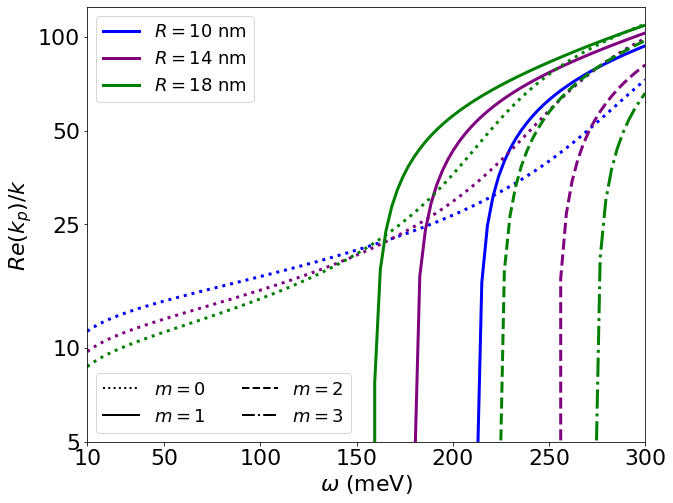

In [18]:
plt.rcParams.update({'font.size': 22})

plt.plot(1000*omega_ev_array,np.real(kp_sil_10_0), color='blue', linewidth=3, linestyle='dotted')
R1, = plt.plot(1000*omega_ev_array,np.real(kp_sil_10_1), color='blue', linewidth=3, linestyle='solid', label='$R = 10$ nm')

plt.plot(1000*omega_ev_array,np.real(kp_sil_14_0), color='purple', linewidth=3, linestyle='dotted')
R2, = plt.plot(1000*omega_ev_array,np.real(kp_sil_14_1), color='purple', linewidth=3, linestyle='solid', label='$R = 14$ nm')
plt.plot(1000*omega_ev_array,np.real(kp_sil_14_2), color='purple', linewidth=3, linestyle='dashed')

plt.plot(1000*omega_ev_array,np.real(kp_sil_18_0), color='green', linewidth=3, linestyle='dotted')
R3, = plt.plot(1000*omega_ev_array,np.real(kp_sil_18_1), color='green', linewidth=3, linestyle='solid', label='$R = 18$ nm')
plt.plot(1000*omega_ev_array,np.real(kp_sil_18_2), color='green', linewidth=3, linestyle='dashed')
plt.plot(1000*omega_ev_array,np.real(kp_sil_18_3), color='green', linewidth=3, linestyle='dashdot')

m0, = plt.plot([0,0], [0,0], color='black', linewidth=2, linestyle='dotted', label='$m=0$')
m1, = plt.plot([0,0], [0,0], color='black', linewidth=2, linestyle='solid', label='$m=1$')
m2, = plt.plot([0,0], [0,0], color='black', linewidth=2, linestyle='dashed', label='$m=2$')
m3, = plt.plot([0,0], [0,0], color='black', linewidth=2, linestyle='dashdot', label='$m=3$')

#plt.xscale('log')
plt.yscale('log')

plt.xlim([10,300])
plt.ylim([5,125])
plt.minorticks_off()

style_legend = plt.legend(handles = [m0, m1, m2, m3], loc='lower left', ncol=2, fontsize=18)
ax = plt.gca().add_artist(style_legend)
plt.legend(handles = [R1,R2,R3], loc = 'upper left', fontsize=18)

plt.xticks([10,50,100,150,200,250,300])
plt.yticks(ticks = [5,10,25,50,100], labels = [5,10,25,50,100])
plt.xlabel('$\omega$ (meV)')
plt.ylabel('$Re(k_p)/k$')
plt.savefig('figs/fig3a')
plt.show()

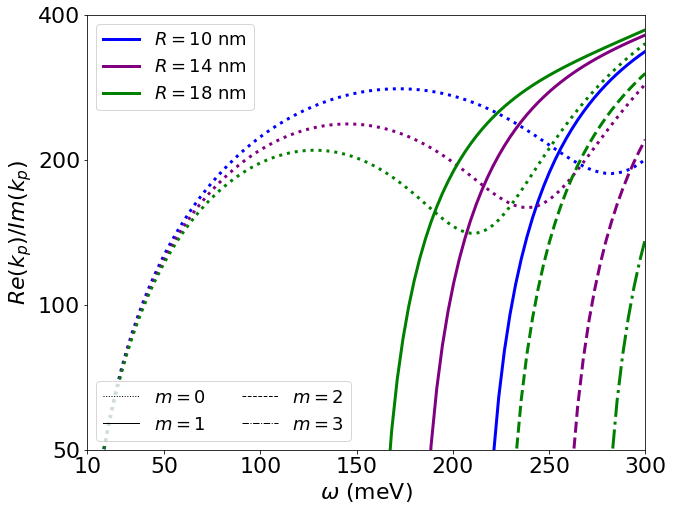

In [19]:
warnings.filterwarnings('ignore')
plt.plot(1000*omega_ev_array,np.real(kp_sil_10_0)/np.imag(kp_sil_10_0), color='blue', linewidth=3, linestyle='dotted')
R1, = plt.plot(1000*omega_ev_array,np.real(kp_sil_10_1)/np.imag(kp_sil_10_1), color='blue', linewidth=3, linestyle='solid', label='$R = 10$ nm')

plt.plot(1000*omega_ev_array,np.real(kp_sil_14_0)/np.imag(kp_sil_14_0), color='purple', linewidth=3, linestyle='dotted')
R2, = plt.plot(1000*omega_ev_array,np.real(kp_sil_14_1)/np.imag(kp_sil_14_1), color='purple', linewidth=3, linestyle='solid', label='$R = 14$ nm')
plt.plot(1000*omega_ev_array,np.real(kp_sil_14_2)/np.imag(kp_sil_14_2), color='purple', linewidth=3, linestyle='dashed')

plt.plot(1000*omega_ev_array,np.real(kp_sil_18_0)/np.imag(kp_sil_18_0), color='green', linewidth=3, linestyle='dotted')
R3, = plt.plot(1000*omega_ev_array,np.real(kp_sil_18_1)/np.imag(kp_sil_18_1), color='green', linewidth=3, linestyle='solid', label='$R = 18$ nm')
plt.plot(1000*omega_ev_array,np.real(kp_sil_18_2)/np.imag(kp_sil_18_2), color='green', linewidth=3, linestyle='dashed')
plt.plot(1000*omega_ev_array,np.real(kp_sil_18_3)/np.imag(kp_sil_18_3), color='green', linewidth=3, linestyle='dashdot')

m0, = plt.plot([0,0], [0,0], color='black', linewidth=1, linestyle='dotted', label='$m=0$')
m1, = plt.plot([0,0], [0,0], color='black', linewidth=1, linestyle='solid', label='$m=1$')
m2, = plt.plot([0,0], [0,0], color='black', linewidth=1, linestyle='dashed', label='$m=2$')
m3, = plt.plot([0,0], [0,0], color='black', linewidth=1, linestyle='dashdot', label='$m=3$')

#plt.xscale('log')
plt.yscale('log')
plt.minorticks_off()
plt.xlim([10,300])
plt.ylim([50,400])

style_legend = plt.legend(handles = [m0, m1, m2, m3], loc='lower left', ncol=2, fontsize=18)
ax = plt.gca().add_artist(style_legend)
plt.legend(handles = [R1,R2,R3], loc = 'upper left', fontsize=18)

plt.xticks([10,50,100,150,200,250,300])
plt.yticks(ticks = [50,100,200,400], labels = [50,100,200,400])
plt.xlabel('$\omega$ (meV)')
plt.ylabel('$Re(k_p)/Im(k_p)$')
plt.savefig('figs/fig3b')
plt.show()

# Fig 4

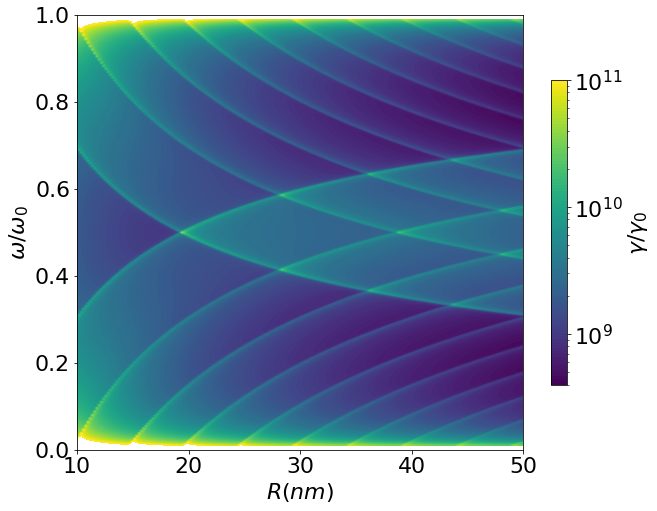

In [22]:
from matplotlib import ticker, cm

omega_steps = np.arange(0.01,0.99001,0.002)
R_nm_array = np.arange(10,50.001,0.2)
gammas_half1 = np.load('contour_plot_data_10_15.npy')
gammas_half2 = np.load('contour_plot_data_15_20.npy')
gammas_half3 = np.load('contour_plot_data_20_25.npy')
gammas_half4 = np.load('contour_plot_data_25_30.npy')
gammas_half5 = np.load('contour_plot_data_30_35.npy')
gammas_half6 = np.load('contour_plot_data_35_40.npy')
gammas_half7 = np.load('contour_plot_data_40_45.npy')
gammas_half8 = np.load('contour_plot_data_45_50.npy')
gammas_half = np.concatenate((gammas_half1,gammas_half2,gammas_half3,gammas_half4,gammas_half5,gammas_half6,gammas_half7,gammas_half8))

gammas = []
for i in range(len(gammas_half)):
    gammas.append(list(gammas_half[i][:-1]) + list(gammas_half[i][::-1]))
gammas = np.transpose(np.array(gammas))

fig, ax = plt.subplots(figsize=(10, 8),nrows=1, ncols=1)

c = ax.contourf(R_nm_array, omega_steps, gammas, np.logspace(np.log10(4*10**8), 11,100), locator=ticker.LogLocator())
b0 = fig.colorbar(c,ax=ax,ticks=[10**i for i in range(6,13,1)], shrink=0.7, label='$\gamma/\gamma_0$')
ax.set_xlabel("$R (nm)$")
ax.set_ylabel("$\omega/\omega_0$")
plt.yticks([0,0.2,0.4,0.6,0.8,1])
ax.set_xlim(right=50)
plt.savefig('figs/fig4a')
plt.show()

In [17]:
lambda_0 = 4.05*10**(-6)
omega_0 = 2*np.pi*c/lambda_0
mob = 10**4
mu = 0.5*e
T = 300
R = 25*10**(-9)
epsilon1 = 2
epsilon2 = e**2*mu/(R*np.pi*epsilon_0*(hbar*omega_0/2)**2) - 1
epsilon3 = 2*e**2*mu/(R*np.pi*epsilon_0*(hbar*omega_0/2)**2) - 1
epsilon4 = 12
d = 10*10**-9
m_max = 12

gamma_1 = []
gamma_2 = []
gamma_3 = []
gamma_4 = []
omega_steps = np.arange(0.01,0.5001,0.002)

for step in omega_steps:
    print('step:', step)
    gamma_1.append(gamma(omega_0, omega_0*step, mu, tau_g(mob,mu), T, R, d + R, m_max, epsilon=epsilon1))
    gamma_2.append(gamma(omega_0, omega_0*step, mu, tau_g(mob,mu), T, R, d + R, m_max, epsilon=epsilon2))
    gamma_3.append(gamma(omega_0, omega_0*step, mu, tau_g(mob,mu), T, R, d + R, m_max, epsilon=epsilon3))
    gamma_4.append(gamma(omega_0, omega_0*step, mu, tau_g(mob,mu), T, R, d + R, m_max, epsilon=epsilon4))
    gammas = [gamma_1,gamma_2,gamma_3,gamma_4]
    np.save('fig4b.npy',np.array(gammas))

step: 0.01
step: 0.012
step: 0.014
step: 0.016
step: 0.018000000000000002
step: 0.02
step: 0.022
step: 0.024
step: 0.026000000000000002
step: 0.028000000000000004
step: 0.03
step: 0.032
step: 0.034
step: 0.036000000000000004
step: 0.038
step: 0.04
step: 0.042
step: 0.044000000000000004
step: 0.046000000000000006
step: 0.048
step: 0.05
step: 0.052000000000000005
step: 0.054
step: 0.056
step: 0.058
step: 0.060000000000000005
step: 0.062000000000000006
step: 0.064
step: 0.066
step: 0.068
step: 0.06999999999999999
step: 0.072
step: 0.074
step: 0.076
step: 0.078
step: 0.08
step: 0.082
step: 0.08399999999999999
step: 0.086
step: 0.088
step: 0.09
step: 0.092
step: 0.094
step: 0.096
step: 0.09799999999999999
step: 0.09999999999999999
step: 0.102
step: 0.104
step: 0.106
step: 0.108
step: 0.11
step: 0.112
step: 0.114
step: 0.11599999999999999
step: 0.118
step: 0.12
step: 0.122
step: 0.124
step: 0.126
step: 0.128
step: 0.13
step: 0.132
step: 0.134
step: 0.136
step: 0.138
step: 0.14
step: 0.142000

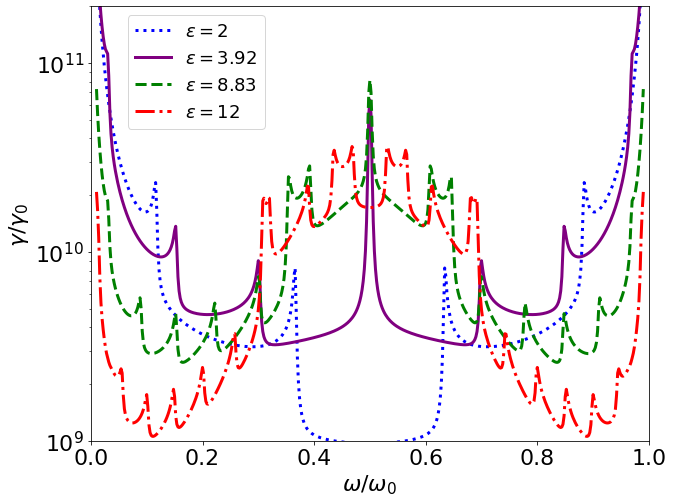

In [37]:
omega_ar = np.arange(0.01,0.99001,0.002)

gammas = np.load('fig4b.npy').tolist()
gamma_1l = gammas[0]
gamma_2l = gammas[1]
gamma_3l = gammas[2]
gamma_4l = gammas[3]

plt.plot(omega_ar, gamma_1l[:-1] + gamma_1l[::-1], label='$\epsilon = 2$', linewidth=3, linestyle='dotted',color='blue')
plt.plot(omega_ar, gamma_2l[:-1] + gamma_2l[::-1], label='$\epsilon = 3.92$', linewidth=3, linestyle='solid',color='purple')
plt.plot(omega_ar, gamma_3l[:-1] + gamma_3l[::-1], label='$\epsilon = 8.83$', linewidth=3, linestyle='dashed', color='green')
plt.plot(omega_ar, gamma_4l[:-1] + gamma_4l[::-1], label='$\epsilon = 12$', linewidth=3, linestyle='dashdot', color='red')

plt.xlim([0,1])
plt.ylim([1*10**9,2*10**11])
plt.legend(loc='upper left', fontsize=18, bbox_to_anchor=(0.05, 0, 1, 1))
plt.xlabel('$\omega/\omega_0$')
plt.ylabel('$\gamma/\gamma_0$')
plt.yscale('log')
plt.savefig('figs/fig4b')
plt.show()

In [2]:
mob = 10**4
mu = 0.5*e
T = 300
R = 25*10**(-9)
distance = 10*10**-9
m_max = 12
MCut = 10
m_max = 10
omegaCut = 0.0000044*e/hbar

ne = 5
ng = 4
d_matrix = []
dne = []
dng = []
for m in range(2,MCut + 1):
    dne.append(d(ne,m))
    dng.append(d(ng,m))

d_matrix.append(dne)
d_matrix.append(dng)

epsilon_array = np.arange(2,6,0.05)
Gammas = []
for epsilon in epsilon_array:
    print('epsilon:', epsilon)
    Gammas.append(Gamma(d_matrix, ne, ng, mu, tau_g(mob,mu), T, R, R + distance, m_max, MCut, omegaCut, epsilon=epsilon))

np.save('Gamma_gcw_epsilon_2_6.npy',np.array(Gammas))

epsilon: 2.0
epsilon: 2.05
epsilon: 2.0999999999999996
epsilon: 2.1499999999999995
epsilon: 2.1999999999999993
epsilon: 2.249999999999999
epsilon: 2.299999999999999
epsilon: 2.3499999999999988
epsilon: 2.3999999999999986
epsilon: 2.4499999999999984
epsilon: 2.4999999999999982
epsilon: 2.549999999999998
epsilon: 2.599999999999998
epsilon: 2.6499999999999977
epsilon: 2.6999999999999975
epsilon: 2.7499999999999973
epsilon: 2.799999999999997
epsilon: 2.849999999999997
epsilon: 2.899999999999997
epsilon: 2.9499999999999966
epsilon: 2.9999999999999964
epsilon: 3.0499999999999963
epsilon: 3.099999999999996
epsilon: 3.149999999999996
epsilon: 3.1999999999999957
epsilon: 3.2499999999999956
epsilon: 3.2999999999999954
epsilon: 3.349999999999995
epsilon: 3.399999999999995
epsilon: 3.449999999999995
epsilon: 3.4999999999999947
epsilon: 3.5499999999999945
epsilon: 3.5999999999999943
epsilon: 3.649999999999994
epsilon: 3.699999999999994
epsilon: 3.749999999999994
epsilon: 3.7999999999999936
epsilon:

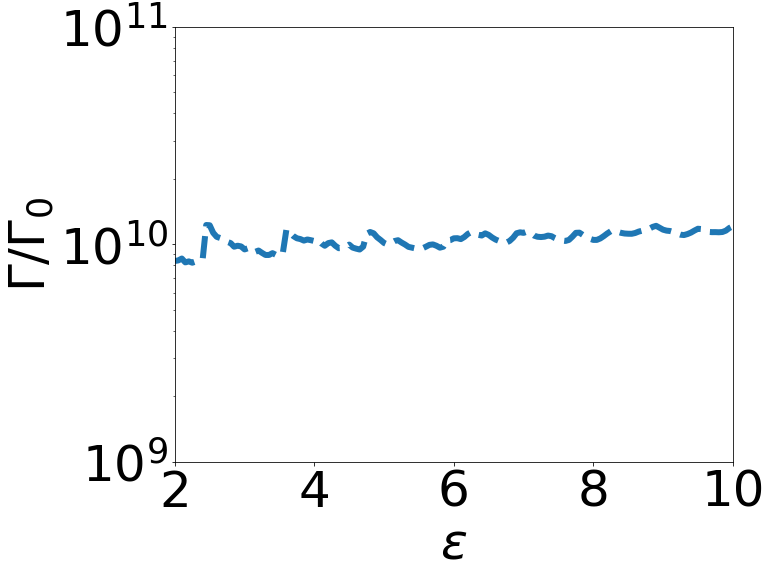

In [39]:
plt.rcParams.update({'font.size': 50})

epsilon_array = np.arange(2,10.01,0.05)
Gammas = np.concatenate((np.load('Gamma_gcw_epsilon_2_6.npy'),np.load('Gamma_gcw_epsilon_6_10.npy')))
#G0 = Gamma_0(d_matrix, 5, 4, 10, omegaCut)

plt.plot(epsilon_array,Gammas/G0, linewidth=6, linestyle = 'dashed')



plt.xlim([2,10])
plt.ylim([10**9,10**11])
plt.xlabel('$\epsilon$')
plt.yscale('log')
plt.ylabel('$\Gamma/\Gamma_0$')
plt.xticks([2,4,6,8,10])
plt.savefig('figs/fig4binset', bbox_inches = "tight")
plt.show()

In [57]:
lambda_0 = 4.05*10**(-6)
omega_0 = 2*np.pi*c/lambda_0
mob = 10**4
mu = 0.5*e
T = 300
R = 25*10**(-9)
epsilon1 = 2.43

d = 10*10**-9
m_max = 12

gamma_1 = []
omega_steps = np.arange(0.01,0.5001,0.005)

for step in omega_steps:
    print('step:', step)
    gamma_1.append(gamma(omega_0, omega_0*step, mu, tau_g(mob,mu), T, R, d + R, m_max, epsilon=epsilon1))

step: 0.01
step: 0.015
step: 0.019999999999999997
step: 0.024999999999999998
step: 0.03
step: 0.034999999999999996
step: 0.039999999999999994
step: 0.045
step: 0.049999999999999996
step: 0.05499999999999999
step: 0.05999999999999999
step: 0.06499999999999999
step: 0.06999999999999999
step: 0.07499999999999998
step: 0.07999999999999999
step: 0.08499999999999998
step: 0.08999999999999998
step: 0.09499999999999999
step: 0.09999999999999998
step: 0.10499999999999998
step: 0.10999999999999997
step: 0.11499999999999998
step: 0.11999999999999998
step: 0.12499999999999997
step: 0.12999999999999998
step: 0.13499999999999998
step: 0.13999999999999999
step: 0.145
step: 0.15
step: 0.155
step: 0.15999999999999998
step: 0.16499999999999998
step: 0.16999999999999998
step: 0.175
step: 0.18
step: 0.18499999999999997
step: 0.18999999999999997
step: 0.19499999999999998
step: 0.19999999999999998
step: 0.205
step: 0.20999999999999996
step: 0.21499999999999997
step: 0.21999999999999997
step: 0.2249999999999

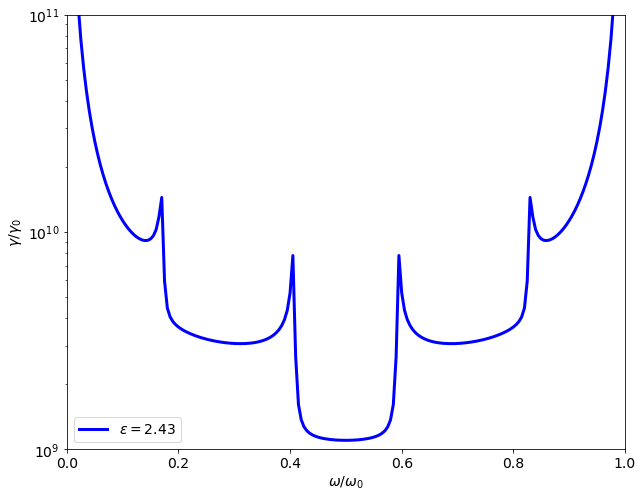

In [65]:
omega_ar = np.arange(0.01,0.99001,0.005)
plt.plot(omega_ar, gamma_1[:-1] + gamma_1[::-1], label='$\epsilon = 2.43$', linewidth=3, color='blue')

plt.xlim([0,1])
plt.ylim([1*10**9,1*10**11])
plt.legend()
plt.xlabel('$\omega/\omega_0$')
plt.ylabel('$\gamma/\gamma_0$')
plt.yscale('log')

In [66]:
mob = 10**4
mu = 0.5*e
T = 300
epsilon_sil = 2.43
R = 25*10**-9
omega_ev_array = np.linspace(0.01,0.3,100)
kp_sil_18_0 = []
kp_sil_18_1 = []
kp_sil_18_2 = []
for omega_ev in omega_ev_array:
    omega = e*omega_ev/hbar
    sigma, _ = conductivity(omega, mu, tau_g(mob,mu), T)

    kp_sil_18_0.append(c*kp_res(0, sigma, omega, mu, tau_g(mob,mu), T, R, 150, epsilon = epsilon_sil)/omega)
    kp_sil_18_1.append(c*kp_res(1, sigma, omega, mu, tau_g(mob,mu), T, R, 60, epsilon = epsilon_sil)/omega)
    kp_sil_18_2.append(c*kp_res(2, sigma, omega, mu, tau_g(mob,mu), T, R, 60, epsilon = epsilon_sil)/omega)

c:\Users\Yuri\Documents\doutorado\nanotubos\carbon_nanotubes\calculations_utils.py:82: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  integral_re = integrate.quad(F_re, 0, 2*np.pi)
c:\Users\Yuri\Documents\doutorado\nanotubos\carbon_nanotubes\calculations_utils.py:83: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  integral_im = integrate.quad(F_im, 0, 2*np.pi)
c:\Users\Yuri\Documents\doutorado\nanotubos\carbon_nanotubes\calculations_utils.py:82: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
 

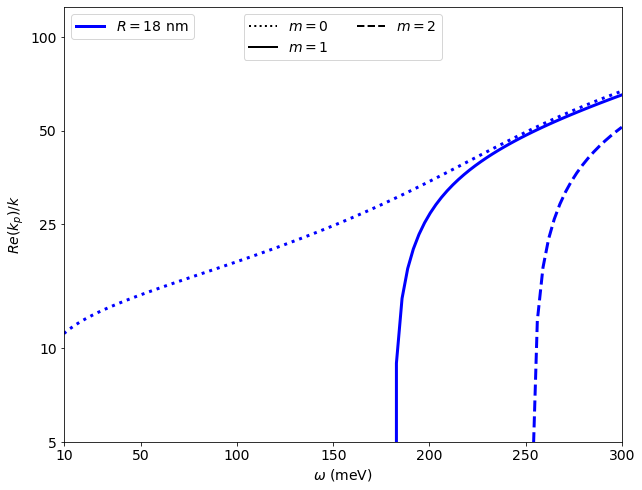

In [70]:
plt.plot(1000*omega_ev_array,np.real(kp_sil_18_0), color='blue', linewidth=3, linestyle='dotted')
R3, = plt.plot(1000*omega_ev_array,np.real(kp_sil_18_1), color='blue', linewidth=3, linestyle='solid', label='$R = 18$ nm')
plt.plot(1000*omega_ev_array,np.real(kp_sil_18_2), color='blue', linewidth=3, linestyle='dashed')

m0, = plt.plot([0,0], [0,0], color='black', linewidth=2, linestyle='dotted', label='$m=0$')
m1, = plt.plot([0,0], [0,0], color='black', linewidth=2, linestyle='solid', label='$m=1$')
m2, = plt.plot([0,0], [0,0], color='black', linewidth=2, linestyle='dashed', label='$m=2$')

#plt.xscale('log')
plt.yscale('log')

plt.xlim([10,300])
plt.ylim([5,125])
plt.minorticks_off()

style_legend = plt.legend(handles = [m0, m1, m2], loc='upper center', ncol=2)
ax = plt.gca().add_artist(style_legend)
plt.legend(handles = [R3], loc = 'upper left')

plt.xticks([10,50,100,150,200,250,300])
plt.yticks(ticks = [5,10,25,50,100], labels = [5,10,25,50,100])
plt.xlabel('$\omega$ (meV)')
plt.ylabel('$Re(k_p)/k$')
plt.show()

In [78]:
mob = 10**4
mu = 0.5*e
T = 300
epsilon_sil = 4.74
R = 25*10**-9
omega_ev_array = np.linspace(0.01,0.3,100)
kp_sil_18_0 = []
kp_sil_18_1 = []
kp_sil_18_2 = []
kp_sil_18_3 = []
kp_sil_18_4 = []
for omega_ev in omega_ev_array:
    omega = e*omega_ev/hbar
    sigma, _ = conductivity(omega, mu, tau_g(mob,mu), T)

    kp_sil_18_0.append(c*kp_res(0, sigma, omega, mu, tau_g(mob,mu), T, R, 150, epsilon = epsilon_sil)/omega)
    kp_sil_18_1.append(c*kp_res(1, sigma, omega, mu, tau_g(mob,mu), T, R, 60, epsilon = epsilon_sil)/omega)
    kp_sil_18_2.append(c*kp_res(2, sigma, omega, mu, tau_g(mob,mu), T, R, 60, epsilon = epsilon_sil)/omega)
    kp_sil_18_3.append(c*kp_res(3, sigma, omega, mu, tau_g(mob,mu), T, R, 60, epsilon = epsilon_sil)/omega)
    kp_sil_18_4.append(c*kp_res(4, sigma, omega, mu, tau_g(mob,mu), T, R, 60, epsilon = epsilon_sil)/omega)

c:\Users\Yuri\Documents\doutorado\nanotubos\carbon_nanotubes\calculations_utils.py:82: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  integral_re = integrate.quad(F_re, 0, 2*np.pi)
c:\Users\Yuri\Documents\doutorado\nanotubos\carbon_nanotubes\calculations_utils.py:83: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  integral_im = integrate.quad(F_im, 0, 2*np.pi)


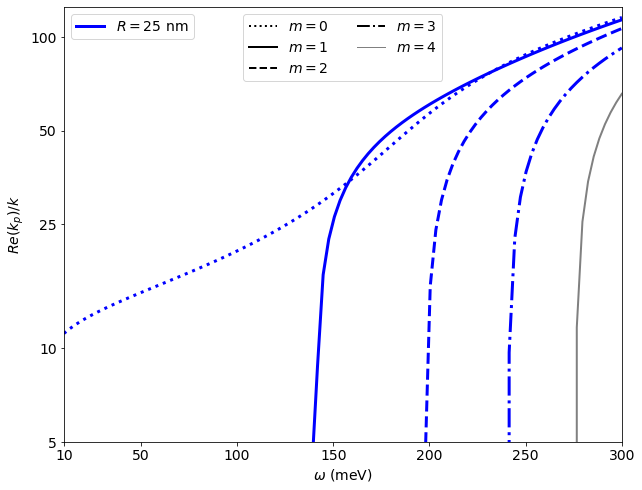

In [79]:
plt.plot(1000*omega_ev_array,np.real(kp_sil_18_0), color='blue', linewidth=3, linestyle='dotted')
R3, = plt.plot(1000*omega_ev_array,np.real(kp_sil_18_1), color='blue', linewidth=3, linestyle='solid', label='$R = 25$ nm')
plt.plot(1000*omega_ev_array,np.real(kp_sil_18_2), color='blue', linewidth=3, linestyle='dashed')
plt.plot(1000*omega_ev_array,np.real(kp_sil_18_3), color='blue', linewidth=3, linestyle='dashdot')
plt.plot(1000*omega_ev_array,np.real(kp_sil_18_4), color='gray', linewidth=2, linestyle='solid')

m0, = plt.plot([0,0], [0,0], color='black', linewidth=2, linestyle='dotted', label='$m=0$')
m1, = plt.plot([0,0], [0,0], color='black', linewidth=2, linestyle='solid', label='$m=1$')
m2, = plt.plot([0,0], [0,0], color='black', linewidth=2, linestyle='dashed', label='$m=2$')
m3, = plt.plot([0,0], [0,0], color='black', linewidth=2, linestyle='dashdot', label='$m=3$')
m4, = plt.plot([0,0], [0,0], color='gray', linewidth=1, linestyle='solid', label='$m=4$')

#plt.xscale('log')
plt.yscale('log')

plt.xlim([10,300])
plt.ylim([5,125])
plt.minorticks_off()

style_legend = plt.legend(handles = [m0, m1, m2, m3, m4], loc='upper center', ncol=2)
ax = plt.gca().add_artist(style_legend)
plt.legend(handles = [R3], loc = 'upper left')

plt.xticks([10,50,100,150,200,250,300])
plt.yticks(ticks = [5,10,25,50,100], labels = [5,10,25,50,100])
plt.xlabel('$\omega$ (meV)')
plt.ylabel('$Re(k_p)/k$')
plt.show()

# Fig 5

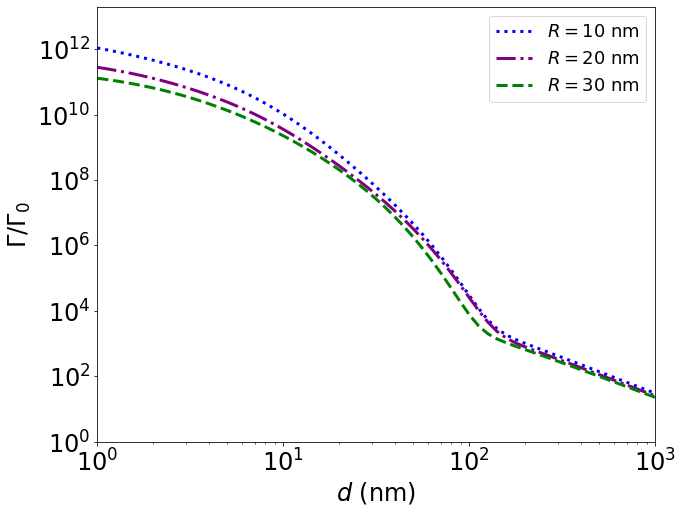

In [44]:
plt.rcParams.update({'font.size': 24})

Gammas = np.load('Gamma_GCW.npy')

"""omegaCut = 0.0000044*e/hbar
MCut = 10
ne = 5
ng = 4
d_matrix = []
dne = []
dng = []
for m in range(2,MCut + 1):
    dne.append(d(ne,m))
    dng.append(d(ng,m))
d_matrix.append(dne)
d_matrix.append(dng)
G0 = Gamma_0(d_matrix, 5, 4, 10, omegaCut)"""

distances_nm = np.logspace(0,3,61)

plt.plot(distances_nm,Gammas[0]/G0, linewidth=3, color='blue', label='$R = 10$ nm', linestyle='dotted')
plt.plot(distances_nm,Gammas[1]/G0, linewidth=3, color='purple', label='$R = 20$ nm', linestyle='dashdot')
plt.plot(distances_nm,Gammas[2]/G0, linewidth=3, color='green', label='$R = 30$ nm', linestyle='dashed')


plt.xlim([1,1000])
plt.ylim([1,2*10**13])
plt.legend(loc='upper right', fontsize=18)
plt.xlabel('$d$ (nm)')
plt.ylabel('$\Gamma/\Gamma_0$')
plt.xscale('log')
plt.yscale('log')
plt.savefig('figs/fig5a')
plt.show()

In [45]:
T = 300
mu = e
R_nm_array = np.array([10, 20, 30])
mob = 10**4
epsilon = 11.68
MCut = 10
m_max = 10
omegaCut = 0.0000044*e/hbar

ne = 5
ng = 4
d_matrix = []
dne = []
dng = []
for m in range(2,MCut + 1):
    dne.append(d(ne,m))
    dng.append(d(ng,m))

d_matrix.append(dne)
d_matrix.append(dng)

distances_nm = np.logspace(0,3,61)
Gamma054 = Gamma01ph(5,4)
Gamma053 = Gamma01ph(5,3)
Gamma052 = Gamma01ph(5,2)
Gammas = []
for R_nm in R_nm_array:
    print('R (nm):', R_nm)
    Gamma_R = []
    for distance_nm in distances_nm:
        print('d (nm):', distance_nm)
        Gamma54 = Gamma054*P_iso(domega(5,4), mu, tau_g(mob,mu), T, R_nm*10**-9, (R_nm + distance_nm)*10**(-9), m_max, epsilon)
        Gamma53 = Gamma053*P_iso(domega(5,3), mu, tau_g(mob,mu), T, R_nm*10**-9, (R_nm + distance_nm)*10**(-9), m_max, epsilon)
        Gamma52 = Gamma052*P_iso(domega(5,2), mu, tau_g(mob,mu), T, R_nm*10**-9, (R_nm + distance_nm)*10**(-9), m_max, epsilon)
        Gamma_R.append(Gamma54 + Gamma53 + Gamma52)
    Gammas.append(Gamma_R)

np.save('Gamma_GCW_1ph.npy',np.array(Gammas))

R (nm): 10
d (nm): 1.0
d (nm): 1.1220184543019633
d (nm): 1.2589254117941673
d (nm): 1.4125375446227544
d (nm): 1.5848931924611136
d (nm): 1.7782794100389228
d (nm): 1.9952623149688797
d (nm): 2.23872113856834
d (nm): 2.51188643150958
d (nm): 2.8183829312644537
d (nm): 3.1622776601683795
d (nm): 3.548133892335755
d (nm): 3.981071705534973
d (nm): 4.466835921509632
d (nm): 5.011872336272724
d (nm): 5.623413251903491
d (nm): 6.309573444801933
d (nm): 7.07945784384138
d (nm): 7.943282347242816
d (nm): 8.912509381337456
d (nm): 10.0
d (nm): 11.220184543019636
d (nm): 12.589254117941675
d (nm): 14.125375446227547
d (nm): 15.848931924611142
d (nm): 17.78279410038923
d (nm): 19.952623149688797
d (nm): 22.3872113856834
d (nm): 25.11886431509581
d (nm): 28.18382931264455
d (nm): 31.622776601683793
d (nm): 35.48133892335755
d (nm): 39.810717055349734
d (nm): 44.668359215096324
d (nm): 50.11872336272725
d (nm): 56.23413251903491
d (nm): 63.09573444801933
d (nm): 70.79457843841381
d (nm): 79.43282

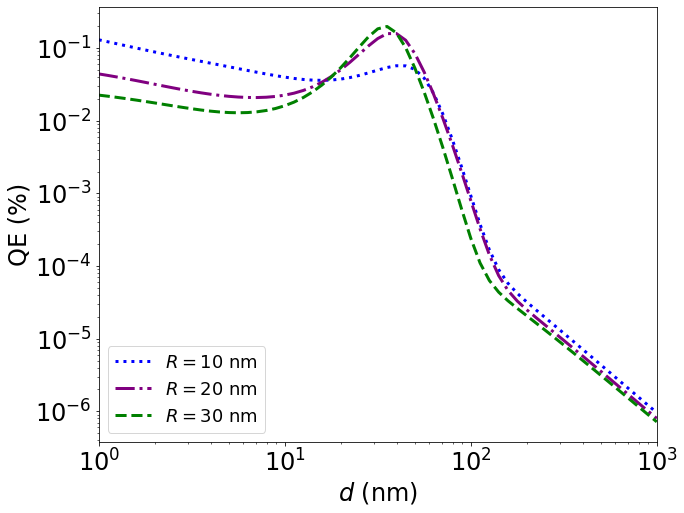

In [47]:
Gammas = np.load('Gamma_GCW.npy')
Gammas1ph = np.load('Gamma_GCW_1ph.npy')
QEs = 100*Gammas/(Gammas + Gammas1ph)
distances_nm = np.logspace(0,3,61)

plt.plot(distances_nm,QEs[0], linewidth=3, color='blue', label='$R = 10$ nm', linestyle='dotted')
plt.plot(distances_nm,QEs[1], linewidth=3, color='purple', label='$R = 20$ nm', linestyle='dashdot')
plt.plot(distances_nm,QEs[2], linewidth=3, color='green', label='$R = 30$ nm', linestyle='dashed')


plt.xlim([1,1000])
#plt.ylim([2*10**4,2*10**13])
plt.legend(loc='lower left', fontsize=18)
plt.xlabel('$d$ (nm)')
plt.ylabel('QE (%)')
plt.yscale('log')
plt.xscale('log')
plt.savefig('figs/fig5b')
plt.show()